In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

from elasticsearch import Elasticsearch, helpers
from scipy.misc import imread, imshow
import matplotlib.pyplot as plt
import numpy as np

print('Done')

Done


In [2]:
vecs = np.load('imagenet_vectors.npy')
img_paths = [l.strip() for l in open('imagenet_paths.txt')]
vecs.min(), vecs.max(), vecs.shape, len(img_paths)

(0.0, 4.527939319610596, (5500, 2048), 5500)

In [3]:
vecs -= np.mean(vecs)
np.mean(vecs)

2.0447280232619132e-16

In [4]:
def get_signature(data, planes):
    sig = np.zeros(len(planes), dtype=np.uint8)
    for i, p in enumerate(planes):
        sig[i] = int(np.dot(data, p) >= 0)
    return sig


def signature_to_text(sig):
    d = ""
    for i, v in enumerate(sig):
        d += "%d_%d " % (i, v)
    return d

In [5]:
bits = 1024
rng = np.random.RandomState(1)
lsh_planes = rng.choice(vecs.flatten(), size=(bits, vecs.shape[-1]))
print(lsh_planes.shape, lsh_planes.mean(), vecs.mean())

(1024, 2048) 0.00010188741549974891 2.0447280232619132e-16


In [8]:
es = Elasticsearch()
actions = []

for i, vec in enumerate(vecs):

    sgtr = get_signature(vec, lsh_planes)
    
    actions.append({
        "_index": "imagenet_test",
        "_type": "image",
        "_id": i,
        "_source": {
            "path": img_paths[i],
            "lsh_hash": signature_to_text(sgtr)
        }
    })

    if len(actions) == 500:
        helpers.bulk(es, actions)
        actions = []
        print('Inserted %d' % (i + 1))

Inserted 500
Inserted 1000
Inserted 1500
Inserted 2000
Inserted 2500
Inserted 3000
Inserted 3500
Inserted 4000
Inserted 4500
Inserted 5000
Inserted 5500


/home/alex/.envs/insight/lib/python3.5/site-packages/ipykernel_launcher.py:25: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.


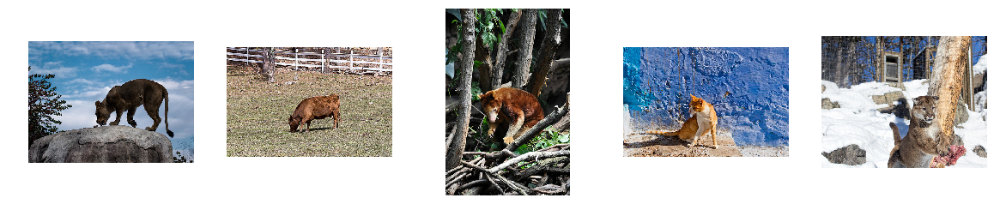

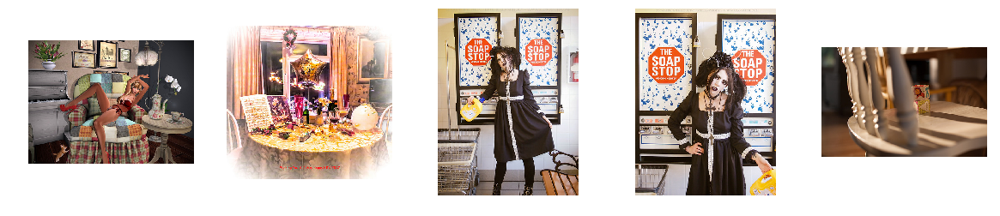

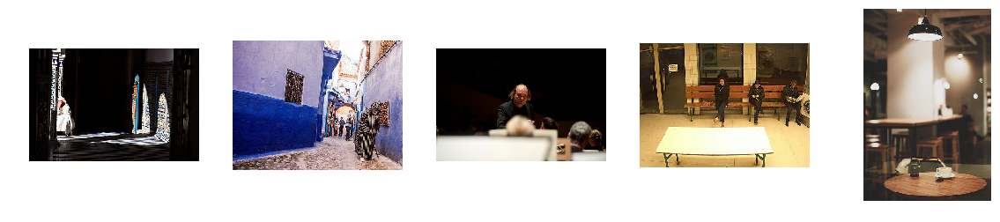

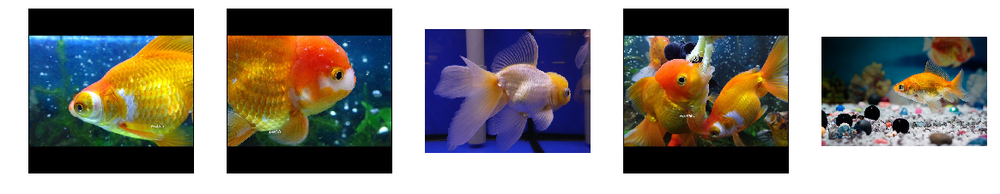

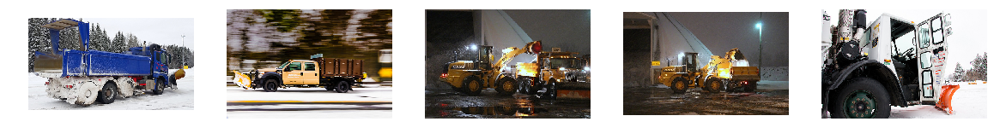

...

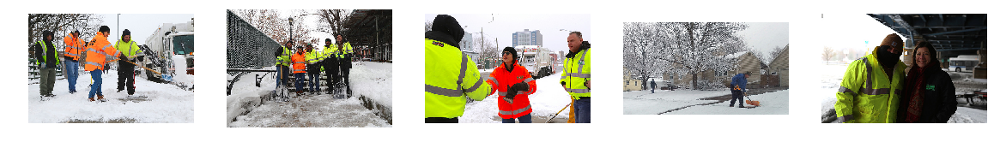

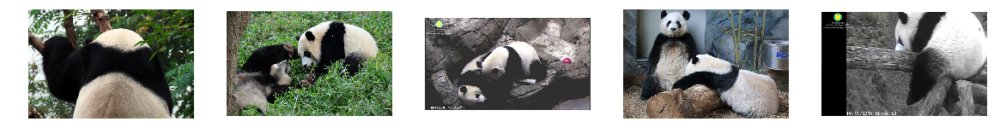

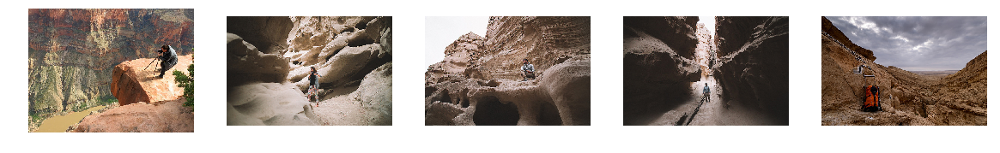

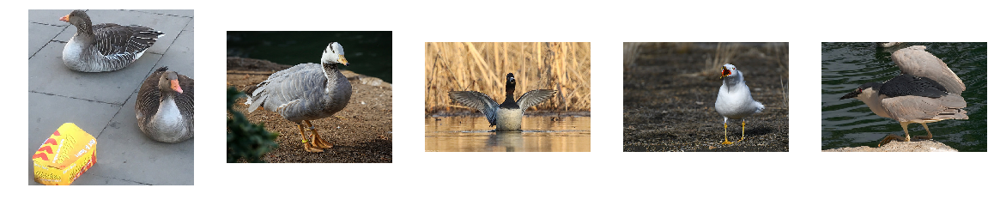

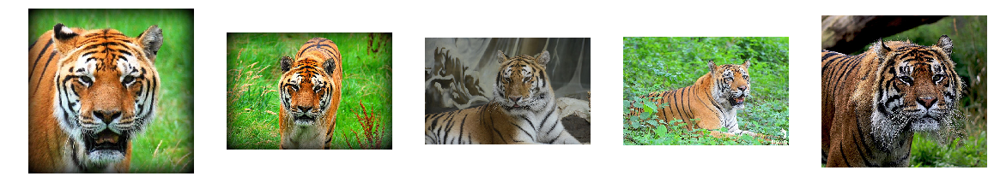

In [9]:
def query(path):
    
    res = es.search(index='imagenet_test', doc_type='image', body={
        "query": {
            "match": {
                "path": path
            }
        }
    })
    
    lsh_hash = res['hits']['hits'][0]['_source']['lsh_hash']
    
    res = es.search(index='imagenet_test', doc_type='image', body={
        "query": {
            "match": {
                "lsh_hash": lsh_hash
            }
        }
    })
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    
    for i, hit in enumerate(res['hits']['hits'][:len(axes)]):
        path = hit['_source']['path']
        img = imread(path)
        axes[i].imshow(img)
        axes[i].axis('off')
    
    plt.show()
    
    
base_path = '/home/alex/Downloads/ILSVRC/Data/DET/test'
    
for i in range(1, 26):
    path = '%s/ILSVRC2017_test_0000%04d.JPEG' % (base_path, i)
    query(path)
    
for i in np.random.randint(1, 5499, 15):
    path = '%s/ILSVRC2017_test_0000%04d.JPEG' % (base_path, i)
    query(path)